<Body>   
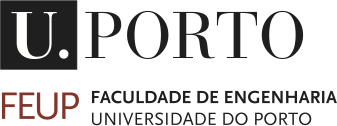   
<h1> <b>Perception and Mapping </b> </h1>
<p><b>Andry Maykol Pinto </b> (amgp@fe.up.pt)</p>
<p><b>Anibal C. Matos </b> (amgp@fe.up.pt)</p>
<p>Department of Electrical and Computer Engineering</p>
</Body>  
FEUP

---

# **Complete:**

 <font color='red'> Christian Geyer </font>

# Underwater inspection of 3D objects using stereo vision

In this assignment, you will explore multiview geometry and 3D reconstruction using data acquired from a calibrated stereo camera rig operating underwater. The stereo rig captures synchronized left and right images of a horizontally placed anode as the sensor moves from left to right along the object.

The underwater environment adds challenges such as light scattering, refraction and contrast loss, which make stereo correspondence and 3D reconstruction more difficult than in air. Your goal is to process this dataset to generate a textured 3D model of the anode, analyze its geometric and physical properties, and evaluate reconstruction quality under different strategies.

The goal is to automatize an inspection pipeline completely. You will build a pipeline that includes:

1) Extracting 3D point clouds from stereo pairs. Texturing the point cloud for visual realism.

2) Applying feature-based or dense stereo matching to estimate disparities.

3) Preprocessing and filtering noisy or spurious 3D points.

4) Registering multiple point clouds into a single coherent 3D model.

5) Performing physical measurements (width, height, volume and bracket dimensions).




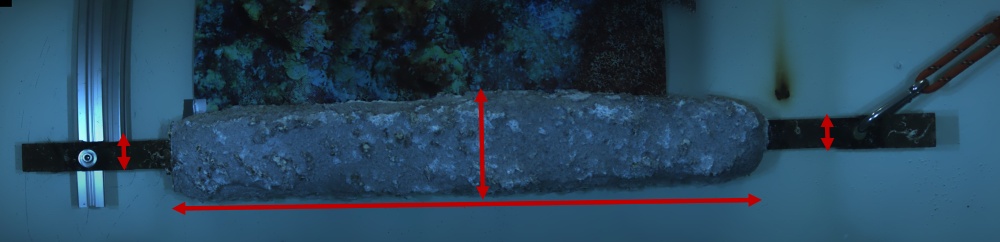

## Prepare Libraries

In [102]:
# Install Open3D library
!pip install open3d

In [2]:
# Import libraries
import numpy as np
import open3d as o3d
import copy

# Visualization
import plotly.graph_objects as go  # plotly to visualize since COLAB does not allow to use O3D functions
import matplotlib.pyplot as plt    # or, Matplotlib
from mpl_toolkits import mplot3d
import seaborn as sns

from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report
)

import pickle
import os
from typing import Any, List, Tuple, Dict, Optional


### Added libraries

In [104]:
# more libraries
import xml.etree.ElementTree as ET
import cv2
import re
from google.colab.patches import cv2_imshow # for image display since cv2.imshow crashes the Colab
from matplotlib.colors import Normalize


Some libraries were added to the project. The most important was cv2 for image processing, but others also added helpful functionality like reading .xml files (ET) or splitting strings (re).

In [105]:
# Visualize point cloud as a scatter plot using matplotlib (as an image!)
def plot_pointcloud_matplotlib_singleview (pt, title_ = ' ', view_ =(-90, 90, 0)):
  colors = None
  if pt.has_colors():
      colors = np.asarray(pt.colors)
  elif pt.has_normals():
      colors = (0.5, 0.5, 0.5) + np.asarray(pt.normals) * 0.5
  else:
      pt.paint_uniform_color((1.0, 0.0, 0.0))
      colors = np.asarray(pt.colors)

  points = np.asarray(pt.points)
  # Single View
  ax = plt.axes(projection='3d')
  ax.view_init(view_[0], view_[1], view_[2])
  ax.axis("on")
  ax.scatter(points[:,0], points[:,1], points[:,2], c=colors)
  ax.set_xlabel('X axis')
  ax.set_ylabel('Y axis')
  ax.set_zlabel('Z axis')

  plt.title(title_)
  plt.show()

#Plotly
def draw_geometries(geometries):
    graph_objects = []

    for geometry in geometries:
        geometry_type = geometry.get_geometry_type()

        if geometry_type == o3d.geometry.Geometry.Type.PointCloud:
            points = np.asarray(geometry.points)
            colors = None
            if geometry.has_colors():
                colors = np.asarray(geometry.colors)
            elif geometry.has_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(geometry.normals) * 0.5
                geometry.colors = o3d.utility.Vector3dVector(colors)
            else:
                geometry.paint_uniform_color((1.0, 0.0, 0.0))
                colors = np.asarray(geometry.colors)

            scatter_3d = go.Scatter3d(x=points[:,0], y=points[:,1], z=points[:,2], mode='markers', marker=dict(size=2, color=colors))
            graph_objects.append(scatter_3d)

        if geometry_type == o3d.geometry.Geometry.Type.TriangleMesh:
            triangles = np.asarray(geometry.triangles)
            vertices = np.asarray(geometry.vertices)
            colors = None
            if geometry.has_triangle_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(geometry.triangle_normals) * 0.5
                colors = tuple(map(tuple, colors))
            else:
                colors = (1.0, 0.0, 0.0)

            mesh_3d = go.Mesh3d(x=vertices[:,0], y=vertices[:,1], z=vertices[:,2], i=triangles[:,0], j=triangles[:,1], k=triangles[:,2], facecolor=colors, opacity=0.50)
            graph_objects.append(mesh_3d)

        if geometry_type == o3d.geometry.Geometry.Type.VoxelGrid:
            bounds     = geometry.get_max_bound()-geometry.get_min_bound()

            voxels     = geometry.get_voxels()   # Returns List of Voxel
            vox_mesh   = o3d.geometry.TriangleMesh()

            for v in voxels:
                cube = o3d.geometry.TriangleMesh.create_box(width=1, height=1, depth=1)
                cube.paint_uniform_color(v.color)
                cube.translate(v.grid_index, relative=False)
                vox_mesh += cube

            vox_mesh.translate([0.5,0.5,0.5], relative=True)

            vox_mesh.merge_close_vertices(0.0000001)
            # T=np.array([[1, 0, 0, 0],[0, 0, 1, 0],[0, -1, 0, 0],[0, 0, 0, 1]])
            vox_mesh.translate(geometry.origin, relative=True)

            # Now is like a TriangleMesh
            triangles = np.asarray(vox_mesh.triangles)
            vertices = np.asarray(vox_mesh.vertices)
            colors = None
            if vox_mesh.has_triangle_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(vox_mesh.triangle_normals) * 0.5
                colors = tuple(map(tuple, colors))
            else:
                vox_mesh.compute_vertex_normals()
                colors = (0.5, 0.5, 0.5) + np.asarray(vox_mesh.triangle_normals) * 0.5
                colors = tuple(map(tuple, colors))                                        # or colors = (0, 0, 0)

            mesh_3d = go.Mesh3d(x=vertices[:,0], y=vertices[:,1], z=vertices[:,2], i=triangles[:,0], j=triangles[:,1], k=triangles[:,2], facecolor=colors, opacity=0.50)
            graph_objects.append(mesh_3d)

    fig = go.Figure(
        data=graph_objects,
        layout=dict(
            scene=dict(
                xaxis=dict(visible=False),
                yaxis=dict(visible=False),
                zaxis=dict(visible=False)
            )
        )
    )
    fig.show()

In [106]:
o3d.visualization.draw_geometries = draw_geometries # replacing the function of Open3D

## Prepare Dataset


This dataset will be available in the following directory `./PM_Dataset/PM_Anode_Data/`. Inside this folder, you will find:

1) A sequence of stereo image pairs (see folders `Left_Image` and `Right_Image`). Each stereo image pair follows a timestamp-based naming convention, for example:

> `left1703089978884525728.png` and `right1703089978884525728.png`

>`left1703089979137789888.png` and `right1703089979137789888.png`

The numeric component in each filename represents a precise capture timestamp, typically derived from the system clock or camera hardware trigger. These timestamps indicate the exact moment of acquisition and are crucial for ensuring temporal synchronization between the left and right cameras.

When constructing 3D point clouds, it is essential to match left and right images captured at the same or nearest timestamps. Even small temporal mismatches-on the order of milliseconds-can lead to inconsistent geometry, disparity errors and blurring of reconstructed features, especially in dynamic or refractive underwater environments. Therefore, synchronization between stereo pairs should be performed as tightly as possible, ideally by matching image files whose timestamps are identical or differ by less than the acquisition precision of the system.


2) The stereo calibration parameters in file `StereoCalib.xml` like Intrinsic matrices ($K_1, K_2$), Lens distortion coefficients  ($D_1, D_2$) and Extrinsic parameters (rotation and translation between cameras).



### Download Dataset

In [107]:
# Download Dataset for training
!wget 'https://uporto-my.sharepoint.com/:u:/g/personal/up488707_up_pt/EYGpPCgkmrJCqVeHdDlozDYB6P5-ZQzOr-ByaAhYidJnMg?download=1' -O PM_Dataset.zip

--2025-11-12 18:57:48--  https://uporto-my.sharepoint.com/:u:/g/personal/up488707_up_pt/EYGpPCgkmrJCqVeHdDlozDYB6P5-ZQzOr-ByaAhYidJnMg?download=1
Resolving uporto-my.sharepoint.com (uporto-my.sharepoint.com)... 13.107.136.10, 13.107.138.10, 2620:1ec:8f8::10, ...
Connecting to uporto-my.sharepoint.com (uporto-my.sharepoint.com)|13.107.136.10|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /personal/up488707_up_pt/Documents/AULAS/UC_Perception/DataSets/Reconstruction_Underwater/PM_Anode_Data_2025.zip?ga=1 [following]
--2025-11-12 18:57:48--  https://uporto-my.sharepoint.com/personal/up488707_up_pt/Documents/AULAS/UC_Perception/DataSets/Reconstruction_Underwater/PM_Anode_Data_2025.zip?ga=1
Reusing existing connection to uporto-my.sharepoint.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 405245962 (386M) [application/x-zip-compressed]
Saving to: ‘PM_Dataset.zip’

PM_Dataset.zip      100%[===================>] 386.47M  64.0MB/s    in 12s     


In [108]:
# Extract point clouds from ZIP file.
import zipfile
import os

with zipfile.ZipFile("PM_Dataset.zip", mode="r") as archive:
  for file in archive.namelist():
    archive.extract(file, "PM_Dataset/")

# Global variables

In [109]:
# global variables
stereoCalib_path_global = "./PM_Dataset/PM_Anode_Data/StereoCalib.xml"
left_path_global = "./PM_Dataset/PM_Anode_Data/Left_Image/"
right_path_global = "./PM_Dataset/PM_Anode_Data/Right_Image/"
stereoCalib_dict_global = {} # dictionary with all contents from StereoCalib.xml
timestamps_left_global = [] # ordered left camera timestamps
timestamps_right_global = [] # corresponding right camera timestamps
left_undistorted_global = []
right_undistorted_global = []
left_rectified_global = []
right_rectified_global = []
left_enhanced_global = []
right_enhanced_global = []
sift_params_global = {"nfeatures": 10000,
                      "contrastThreshold": 0.02,
                      "edgeThreshold": 20}

# Download pre-processed images

In [110]:
use_preprocessed = True

In [111]:
if use_preprocessed:
  !pip install -q gdown
  import gdown

  # Use the FILE ID from Drive link:
  # https://drive.google.com/file/d/1otWnleGB3m5g1ziva1tmOeXMoTTTf0V1/view
  file_id = "1otWnleGB3m5g1ziva1tmOeXMoTTTf0V1"
  gdown.download(f"https://drive.google.com/uc?id={file_id}", "Images_processed.zip", quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1otWnleGB3m5g1ziva1tmOeXMoTTTf0V1
From (redirected): https://drive.google.com/uc?id=1otWnleGB3m5g1ziva1tmOeXMoTTTf0V1&confirm=t&uuid=befe4b7b-47a4-424b-9234-354afd9dcc03
To: /content/Images_processed.zip
100%|██████████| 1.49G/1.49G [00:46<00:00, 31.8MB/s]


In [112]:
if use_preprocessed:
  with zipfile.ZipFile("Images_processed.zip", mode="r") as archive:
    for file in archive.namelist():
      archive.extract(file, "Images_processed/")

In [ ]:
def load_preprocessed_data():
  undistL, rectifyL, enhanceL = [], [], []
  undistR, rectifyR, enhanceR = [], [], []
  path = "./Images_processed/left_undistorted_global/"
  file_paths = [os.path.join(path, f) for f in os.listdir(path)]
  for fp in file_paths:
    img = cv2.imread(fp)
    undistL.append(img)


In [130]:
import os
import cv2

def load_preprocessed_data(base_path="./Images_processed"):
    # Define all folder paths
    folders = {
        "undistL": os.path.join(base_path, "left_undistorted_global"),
        "rectifyL": os.path.join(base_path, "left_rectified_global"),
        "enhanceL": os.path.join(base_path, "left_enhanced_global"),
        "undistR": os.path.join(base_path, "right_undistorted_global"),
        "rectifyR": os.path.join(base_path, "right_rectified_global"),
        "enhanceR": os.path.join(base_path, "right_enhanced_global"),
    }

    # Initialize storage
    undistL, rectifyL, enhanceL = [], [], []
    undistR, rectifyR, enhanceR = [], [], []

    # Helper to load all images in sorted order
    def load_images_from_folder(folder):
        if not os.path.exists(folder):
            print(f"Folder not found: {folder}")
            return []
        file_paths = sorted(
            [os.path.join(folder, f) for f in os.listdir(folder) if f.lower().endswith((".png", ".jpg", ".jpeg"))]
        )
        return [cv2.imread(fp) for fp in file_paths]

    # Load each set
    undistL = load_images_from_folder(folders["undistL"])
    rectifyL = load_images_from_folder(folders["rectifyL"])
    enhanceL = load_images_from_folder(folders["enhanceL"])
    undistR = load_images_from_folder(folders["undistR"])
    rectifyR = load_images_from_folder(folders["rectifyR"])
    enhanceR = load_images_from_folder(folders["enhanceR"])

    print(f"  Loaded:")
    print(f"  Left  - Undistorted: {len(undistL)}, Rectified: {len(rectifyL)}, Enhanced: {len(enhanceL)}")
    print(f"  Right - Undistorted: {len(undistR)}, Rectified: {len(rectifyR)}, Enhanced: {len(enhanceR)}")

    return undistL, rectifyL, enhanceL, undistR, rectifyR, enhanceR


In [131]:
left_undistorted_global, left_rectified_global, left_enhanced_global, \
right_undistorted_global, right_rectified_global, right_enhanced_global = load_preprocessed_data()

  Loaded:
  Left  - Undistorted: 138, Rectified: 138, Enhanced: 138
  Right - Undistorted: 138, Rectified: 138, Enhanced: 138


# Deleting Folders -> Careful

In [113]:
def delete_folder(path):
    """
    Deletes a folder and all its contents.

    Args:
        path (str): Path to the folder to delete.
    """
    if os.path.exists(path):
        shutil.rmtree(path)
        print(f"Deleted folder and contents: {path}")
    else:
        print(f"Folder does not exist: {path}")

In [114]:
#delete_folder("")

# Helper Functions

In [115]:
# helper functions
def convert_timestamp2path(path: str, timestamp: int, camera: str):
  return path + camera + str(timestamp) + ".png"

def convert_name2timestamp(name: str):
  delimiters = ["left", "right", ".png"]
  delimiters = list(map(re.escape, delimiters)) # escape special meaning of certain characters like '.' in '.png'
  delimiters = "|".join(delimiters) # create delimiters expression for re.split function, simply separating them by "|"
  s_list = re.split(delimiters, name) # split the filename
  timestamp = s_list[1] # timestamp will always be the second element of the list
  return int(timestamp)

def plot_image_pair(left_image, left_title, right_image, right_title, lines):
  left_image = cv2.cvtColor(left_image, cv2.COLOR_BGR2RGB)
  right_image = cv2.cvtColor(right_image, cv2.COLOR_BGR2RGB)
  fig, axs = plt.subplots(1, 2, figsize=(8, 20))
  axs[0].imshow(left_image)
  axs[1].imshow(right_image)
  if lines is True:
    for y in range(100, 1000, 200):
      for i in range(2):
        # draw horizontal red lines
        axs[i].axhline(y, color='r', linestyle='--')
  if left_title is not None:
    axs[0].set_title(left_title)
  if right_title is not None:
    axs[1].set_title(right_title)
  plt.show()

"""
return 3 lists:
  1) kptsL_coords [(xL,yL)]
  2) kptsR_coords [(xR,yR)]
  3) disp_list [disp]
"""
def feature_based_disparity_map(kptsL, kptsR, matches):
  kptsL_coords = []
  kptsR_coords = []
  disp_list = []
  for i in range(len(matches)):
    m = matches[i][0]
    kptL = kptsL[m.queryIdx]
    kptR = kptsR[m.trainIdx]
    xL,yL = kptL.pt
    xR,yR = kptR.pt
    disp = xL-xR
    dy = abs(yL-yR)
    if disp > 0 and dy <= 2:
      kptsL_coords.append((xL,yL))
      kptsR_coords.append((xR,yR))
      disp_list.append(disp)
  return kptsL_coords, kptsR_coords, disp_list

"""
plotting a sparse disparity map
"""
def plot_feature_based_disparity(img, kpts_xy, disp, radius, title):

  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  kpts_xy = np.asarray(kpts_xy)
  disp = np.asarray(disp)

  vmin = np.min(disp)
  vmax = np.max(disp)

  print(f"vmin = {vmin}, vmax = {vmax}")

  fig, ax = plt.subplots(figsize=(5, 4))
  ax.imshow(img)
  sc = ax.scatter(kpts_xy[:, 0], kpts_xy[:, 1], s=radius**2, c=disp, cmap = "inferno",
                  norm = Normalize(vmin=vmin, vmax=vmax), alpha = 0.9)
  ax.set_xticks([]); ax.set_yticks([])
  ax.invert_yaxis()
  ax.set_title(title)
  cbar = plt.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)

"""
convert a list of disparities into a list of depths
"""
def convert_disparity2depth(disp, calib_dict):
  P1 = calib_dict["P1"]
  fx = P1[0, 0]
  P2 = calib_dict["P2"]
  fx_baseline = -P2[0, 3]
  baseline = fx_baseline / fx
  depths = []
  for d in disp:
    depth = fx*baseline/d
    depths.append(depth)

  return depths




In [116]:
def delete_folder(path):
    """
    Deletes a folder and all its contents.

    Args:
        path (str): Path to the folder to delete.
    """
    if os.path.exists(path):
        shutil.rmtree(path)
        print(f"Deleted folder and contents: {path}")
    else:
        print(f"Folder does not exist: {path}")

In [117]:
delete_folder("Images_processed_2")

Folder does not exist: Images_processed_2


# Exercise 1 — Load the stereo calibration parameters and visualize a few undistorted left/right image pairs.

The first step in your 3D reconstruction pipeline is to load the stereo calibration parameters and inspect how well the cameras are geometrically aligned. Each camera in the stereo rig has its own set of internal characteristics - its intrinsic parameters, which include the focal length and optical center - as well as distortion coefficients that describe how the lens bends light. The calibration file also contains the extrinsic parameters, defining how the right camera is positioned and oriented relative to the left one.

Once these parameters are loaded, the next task is to undistort the raw underwater images. This process corrects for lens distortion and refraction effects that are especially noticeable when imaging through water and a camera housing. Undistortion ensures that straight edges in the real world appear straight in the image, which is fundamental for accurate depth estimation later on. After undistorting a few stereo pairs, take a moment to visualize the left and right images side by side. Observe how the features line up horizontally - well-aligned, distortion-free image pairs will produce more reliable correspondences when you compute disparities and reconstruct depth.

In [118]:
# do implementation here

## Load Stereo Calibration

In [119]:
def load_stereo_calibration_parameters(filepath: str) -> Dict[str, Any]:
  # initialize a dictionary to save the .xml file data
  xml_dict = {}

  # extract names of .xml file Elements using ElementTree
  tree = ET.parse(filepath) # ElementTree
  root = tree.getroot() # root Element
  names = []
  for i in range(len(root)):
    child = root[i]
    names.append(child.tag)

  # create FileStorage to read sequences and mappings saved in .xml file
  fs = cv2.FileStorage(filepath, cv2.FILE_STORAGE_READ)
  for name in names:
    node = fs.getNode(name)
    if node.isMap():
      xml_dict[name] = node.mat()
    elif node.isSeq():
      data = []
      for i in range(node.size()):
        data.append(node.at(i).real())
      xml_dict[name] = np.array(data)

  # release file structure always
  fs.release()

  # return dictionary
  return xml_dict

In [120]:
stereoCalib_dict_global = load_stereo_calibration_parameters(stereoCalib_path_global)
for key, value in stereoCalib_dict_global.items():
  print(f"{key}: {value}")

ImgSize: [1440. 1080.]
K1: [[1.66310528e+03 0.00000000e+00 7.70086858e+02]
 [0.00000000e+00 1.66217619e+03 5.95131202e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
D1: [[-4.81900371e-01  5.33369324e-01 -7.07013782e-04 -2.34751024e-03
  -8.64167579e-01]]
K2: [[1.66490573e+03 0.00000000e+00 7.81276860e+02]
 [0.00000000e+00 1.66446450e+03 5.75939405e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
D2: [[-4.71999720e-01  4.61101696e-01 -1.50174591e-03 -3.53555413e-04
  -7.18289228e-01]]
R: [[ 0.99998094  0.00574737 -0.00225748]
 [-0.00574153  0.99998017  0.00258638]
 [ 0.0022723  -0.00257337  0.99999411]]
T: [[-0.07509213]
 [ 0.00027242]
 [-0.00026915]]
ROI1: [   0.    0. 1440. 1080.]
R1: [[ 0.99999691  0.00211042  0.0013173 ]
 [-0.00211212  0.99999694  0.00129164]
 [-0.00131457 -0.00129442  0.9999983 ]]
P1: [[1.66161079e+03 0.00000000e+00 8.05996796e+02 0.00000000e+00]
 [0.00000000e+00 1.66161079e+03 6.03648926e+02 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.00000000e+0

For extracting the .xml file contents, we use two main datastructures:
* **ElementTree**
* opencv's **FileStorage**

Any .xml file can be converted to an **ElementTree**, which is composed by Elements. Each Element has a list of child Elements. From each Element, we can extract the tag ( E.tag ) and the attributes ( E.attrib ). We use this to get the list of tags stored in the .xml file.

A **FileStorage** can be used to access and read the nodes stored in an .xml file, but the node tags have to be known ( fs.getNode(tag) ). When node.isMap() is true, then the node is an opencv matrix, which can be read using the node.mat() method. When node.isSeq() is true, then the node is a sequence/list, and we can access the size of the list ( node.size() ) and the elements of the list ( node.at(i) ).

## Match Timestamps

In [121]:
def match_timestamps(pathL, pathR, max_delta):
  # max_delta
  if max_delta is None:
    max_delta = np.inf

  # get filenames
  left_names = os.listdir(pathL)
  right_names = os.listdir(pathR)
  # convert names to timestamps
  tL = [convert_name2timestamp(name) for name in left_names]
  tR = [convert_name2timestamp(name) for name in right_names]
  # append +inf and -inf to right timestamps (for the main algorithm to be elegantly implemented)
  tR.append(np.inf)
  tR.append(-np.inf)
  # remove duplicates
  tL = list(set(tL))
  tR = list(set(tR))
  # sort - O(NlogN + MlogM)
  tL.sort()
  tR.sort()
  # initialize indices and final lists
  tL_idx = 0
  tR_idx = 1 # start after the -inf element
  tL_final = []
  tR_final = []
  while tL_idx < len(tL): # search a match for each left timestamp - O(N + M)
    while tL[tL_idx] > tR[tR_idx]:
      tR_idx += 1 # go to first right timestamp that exceeds current left timestamp
    best_tR = tR[tR_idx-1]
    if abs(tL[tL_idx]-tR[tR_idx]) < abs(tL[tL_idx]-best_tR): # find closest right timestamp
      best_tR = tR[tR_idx]
    if abs(tL[tL_idx]-best_tR) < max_delta: # check if difference is within the tolerance
      # append to final lists
      tL_final.append(tL[tL_idx])
      tR_final.append(best_tR)
    tL_idx = tL_idx + 1 # searchh match for the next left timestamp

  # return final timestamp lists
  return tL_final, tR_final

The match timestamps pipeline:
* extract set of different left and right timestamps [tL, tR]
* sort tL and tR
* iterate tL
* for each tL, increment the index of the tR until tR > tL
* choose the best match comparing the difference tR-tL for the 2 candidates: the current and the previous values of tR
* append tL and tR values to final lists if the difference is within tolerance

This algorithm has **complexity O(NlogN+MlogM+N+M)**, where the initial sorting is the most costly part. The main algorithm does a linear scan of the input lists. This is better than brute force matching O(N*M).

## Undistort images

In [122]:
def undistort_images(pathL, pathR, tL_list, tR_list, calib_dict):
  # read relevant calibration matrices
  KL = calib_dict["K1"]
  DL = calib_dict["D1"]
  KR = calib_dict["K2"]
  DR = calib_dict["D2"]

  # read left and right images
  left_images = []
  right_images = []
  for tl, tr in zip(tL_list, tR_list):
    # get file paths
    pL = convert_timestamp2path(pathL, tl, "left")
    pR = convert_timestamp2path(pathR, tr, "right")
    # read images
    imgL = cv2.imread(pL)
    imgR = cv2.imread(pR)
    # append to image list
    left_images.append(imgL)
    right_images.append(imgR)

  # undistort left and right camera images
  left_undistorted = []
  right_undistorted = []
  # compute the mapping only once (costly method)
  hL, wL = left_images[0].shape[:2]
  hR, wR = right_images[0].shape[:2]
  newKL, roiL = cv2.getOptimalNewCameraMatrix(KL, DL, (wL, hL), 1)
  newKR, roiR = cv2.getOptimalNewCameraMatrix(KR, DR, (wR, hR), 1)
  map1L, map2L = cv2.initUndistortRectifyMap(KL, DL, None, newKL, (wL, hL), cv2.CV_32FC1)
  map1R, map2R = cv2.initUndistortRectifyMap(KR, DR, None, newKR, (wR, hR), cv2.CV_32FC1)
  for imgL, imgR in zip(left_images, right_images):
    # remap for undistortion (fast method)
    undistortedL = cv2.remap(imgL, map1L, map2L, cv2.INTER_LINEAR)
    undistortedR = cv2.remap(imgR, map1R, map2R, cv2.INTER_LINEAR)
    # crop with the same roi -> the intersection of left and right ROIs
    xL, yL, w_roiL, h_roiL = roiL
    xR, yR, w_roiR, h_roiR = roiR
    x = max(xL, xR)
    y = max(yL, yR)
    w = min(xL+w_roiL, xR+w_roiR) - x
    h = min(yL+h_roiL, yR+h_roiR) - y
    undistorted_croppedL = undistortedL[y:y+h, x:x+w]
    undistorted_croppedR = undistortedR[y:y+h, x:x+w]

    # append to lists of undistorted images
    left_undistorted.append(undistorted_croppedL)
    right_undistorted.append(undistorted_croppedR)

  # return undistorted images
  return left_undistorted, right_undistorted

In [123]:
timestamps_left_global, timestamps_right_global = match_timestamps(left_path_global,
                                                                   right_path_global,
                                                                   None)

In [124]:
if use_preprocessed:
  print("skipped undistortion")
else:
  left_undistorted_global, right_undistorted_global = undistort_images(left_path_global,
                                                                       right_path_global,
                                                                       timestamps_left_global,
                                                                       timestamps_right_global,
                                                                       stereoCalib_dict_global)

skipped undistortion


## Save undistorted images

file structure:

-- Images_processed

---- left_undistorted_global

------ left[timestamp].png

---- right_undistorted_global

------ right[timestamp].png

In [125]:
save_images_bool = False

In [126]:
import os
import cv2

def save_images(timestampsL, left_undistorted, left_folder_name,
                timestampsR, right_undistorted, right_folder_name,
                base_dir="Images_processed"):
    """
    Saves undistorted stereo images into a structured directory tree:

    base_dir/
        left_undistorted_global/
            left_<timestamp>.png
        right_undistorted_global/
            right_<timestamp>.png
    """

    # --- Create base directories if they don’t exist
    left_dir  = os.path.join(base_dir, left_folder_name)
    right_dir = os.path.join(base_dir, right_folder_name)
    os.makedirs(left_dir, exist_ok=True)
    os.makedirs(right_dir, exist_ok=True)

    # --- Check inputs
    if len(timestampsL) != len(left_undistorted):
        raise ValueError("timestampsL and left_undistorted must have the same length.")
    if len(timestampsR) != len(right_undistorted):
        raise ValueError("timestampsR and right_undistorted must have the same length.")

    # --- Save left images
    for ts, img in zip(timestampsL, left_undistorted):
        filename = os.path.join(left_dir, f"left{ts}.png")
        cv2.imwrite(filename, img)

    # --- Save right images
    for ts, img in zip(timestampsR, right_undistorted):
        filename = os.path.join(right_dir, f"right{ts}.png")
        cv2.imwrite(filename, img)

    print(f"Saved {len(left_undistorted)} left and {len(right_undistorted)} right images in '{base_dir}'")


In [127]:
if not save_images_bool:
  print("skipped saving images")
else:
  save_images(timestamps_left_global,
              left_undistorted_global,
              "left_undistorted_global",
              timestamps_right_global,
              right_undistorted_global,
              "right_undistorted_global")

skipped saving images


In [128]:
for i in range(10):
  print(f"{timestamps_left_global[i]}, {timestamps_right_global[i]}, {timestamps_left_global[i]-timestamps_right_global[i]}")

different_timestamps = 0
for i in range(len(timestamps_left_global)):
  tL = timestamps_left_global[i]
  tR = timestamps_right_global[i]
  if abs(tL-tR) > 0:
    different_timestamps = different_timestamps + 1

print(f"{different_timestamps}/{len(timestamps_left_global)} timestamps don't match perfectly")

1703089947577306912, 1703089947577306912, 0
1703089947659872224, 1703089947659872224, 0
1703089947748044320, 1703089947748044320, 0
1703089947930150656, 1703089947930150656, 0
1703089948086662848, 1703089948086662848, 0
1703089948256300192, 1703089948256300192, 0
1703089948678704512, 1703089948678704512, 0
1703089948844926848, 1703089948844926848, 0
1703089949091412800, 1703089949091412800, 0
1703089949181629568, 1703089949181629568, 0
0/138 timestamps don't match perfectly


## Deliverable

**Deliverable**:


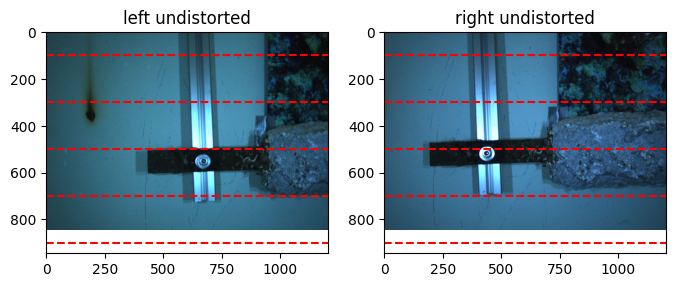

(844, 1204, 3)
(844, 1204, 3)


In [132]:
# (Code) Show one undistorted pair of images (Left and Right)
N = len(left_undistorted_global)
index = 10
index = index%N
left_image = left_undistorted_global[index]
right_image = right_undistorted_global[index]
plot_image_pair(left_image, "left undistorted", right_image, "right undistorted", True)
print(left_image.shape)
print(right_image.shape)


Using simply undistort creates two images that are not horizontally aligned. For dense stereo matching (disparity computation), it is mandatory that both images are rectified and become horizontally aligned.

# Exercise 2 - Stereo Matching and Depth Map Estimation

In this stage, you will **explore one of two** different strategies for computing disparity between the left and right images - each offering distinct advantages in terms of accuracy, density and computational cost.

- Option A (Feature-Based Matching). It begin by detecting distinctive image features using algorithms such as SIFT or ORB. These keypoints capture visually stable patterns that can be reliably identified in both the left and right views. Once detected, match the corresponding features across the image pair to establish pixel correspondences.
With these matches, estimate the fundamental or essential matrix to describe the geometric relationship between the two cameras. Using this relationship, you can then triangulate the matched points to obtain their 3D coordinates in space.

- Option B (Dense Stereo Matching).
Alternatively, you can adopt a dense correspondence approach to compute a disparity value for every pixel in the image. This can be achieved using algorithms like SSD, SAD or OpenCV StereoBM or StereoSGBM, which leverage block matching and semi-global optimization to estimate disparities across the entire image.
Once the disparity map is computed, convert it into a depth map using the known camera baseline (distance between the two cameras) and focal length.

In [133]:
# do implementation here

## Undistort + Rectify

In [134]:
def undistort_rectify_images(pathL, pathR, tL_list, tR_list, calib_dict):
  # read relevant calibration matrices
  KL = calib_dict["K1"]
  DL = calib_dict["D1"]
  PL = calib_dict["P1"]
  RL = calib_dict["R1"]
  KR = calib_dict["K2"]
  DR = calib_dict["D2"]
  PR = calib_dict["P2"]
  RR = calib_dict["R2"]

  # read left and right images
  left_images = []
  right_images = []
  for tl, tr in zip(tL_list, tR_list):
    # get file paths
    pL = convert_timestamp2path(pathL, tl, "left")
    pR = convert_timestamp2path(pathR, tr, "right")
    # read images
    imgL = cv2.imread(pL)
    imgR = cv2.imread(pR)
    # append to image list
    left_images.append(imgL)
    right_images.append(imgR)

  # undistort left and right camera images
  left_rectified = []
  right_rectified = []
  # compute the mapping only once (costly method)
  h, w = left_images[0].shape[:2]
  map1L, map2L = cv2.initUndistortRectifyMap(KL, DL, RL, PL, (w,h), cv2.CV_32FC1)
  map1R, map2R = cv2.initUndistortRectifyMap(KR, DR, RR, PR, (w,h), cv2.CV_32FC1)

  for imgL, imgR in zip(left_images, right_images):
    # remap for undistortion (fast method)
    rectifiedL = cv2.remap(imgL, map1L, map2L, cv2.INTER_LINEAR)
    rectifiedR = cv2.remap(imgR, map1R, map2R, cv2.INTER_LINEAR)

    # append to lists of undistorted images
    left_rectified.append(rectifiedL)
    right_rectified.append(rectifiedR)

  # return undistorted images
  return left_rectified, right_rectified

In [135]:
if use_preprocessed:
  print("skipped rectification")
else:
  left_rectified_global, right_rectified_global = undistort_rectify_images(left_path_global,
                                                                          right_path_global,
                                                                          timestamps_left_global,
                                                                          timestamps_right_global,
                                                                          stereoCalib_dict_global)

skipped rectification


## Save rectified images

file structure:

-- Images_processed

---- left_rectified_global

------ left[timestamp].png

---- right_rectified_global

------ right[timestamp].png

In [136]:
if not save_images_bool:
  print("skipped saving images")
else:
  save_images(timestamps_left_global,
              left_rectified_global,
              "left_rectified_global",
              timestamps_right_global,
              right_rectified_global,
              "right_rectified_global")

skipped saving images


## Preprocessing



In [137]:
def enhance_underwater(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    L, A, B = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    L_eq = clahe.apply(L)
    lab_eq = cv2.merge((L_eq, A, B))
    img_eq = cv2.cvtColor(lab_eq, cv2.COLOR_LAB2BGR)
    result = cv2.xphoto.createSimpleWB().balanceWhite(img_eq)
    result = cv2.detailEnhance(result, sigma_s=10, sigma_r=0.15)
    return result

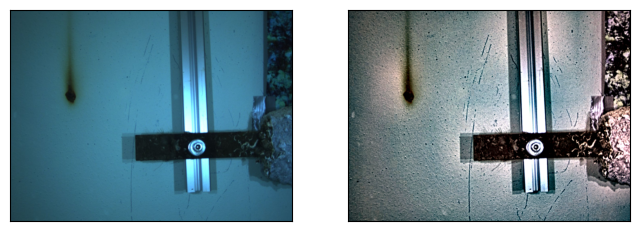

In [138]:
# visualize enhance difference
img = left_rectified_global[0]
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
fig, axs = plt.subplots(1, 2, figsize=(8, 8))
axs[0].imshow(img_rgb)
axs[0].set_xticks([])
axs[0].set_yticks([])
img = enhance_underwater(img)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
axs[1].imshow(img_rgb)
axs[1].set_xticks([])
axs[1].set_yticks([])
plt.show()

In [139]:
if use_preprocessed:
  print("skipped enhancing images")
else:
  left_enhanced_global, right_enhanced_global = [], []
  for i in range(len(timestamps_left_global)):
    print(f"frame {i}/{len(timestamps_left_global)}")
    imgL = left_rectified_global[i]
    imgR = right_rectified_global[i]
    imgL_enhanced = enhance_underwater(imgL)
    imgR_enhanced = enhance_underwater(imgR)
    left_enhanced_global.append(imgL_enhanced)
    right_enhanced_global.append(imgR_enhanced)



skipped enhancing images


## Save enhanced images

file structure:

-- Images_processed

---- left_enhanced_global

------ left[timestamp].png

---- right_enhanced_global

------ right[timestamp].png

In [140]:
if not save_images_bool:
  print("skipped saving images")
else:
  save_images(timestamps_left_global,
              left_enhanced_global,
              "left_enhanced_global",
              timestamps_right_global,
              right_enhanced_global,
              "right_enhanced_global")

skipped saving images


## Zip images and download

In [141]:
import shutil

if not save_images_bool:
  print("skipped creating zip file")
else:
  # Create a ZIP of the folder
  shutil.make_archive("Images_processed", 'zip', "Images_processed")

skipped creating zip file


## Feature Based Matching

In [142]:
"""
params:
  indices: list of indices to access imgL_list and imgR_list

return:
  kptsL_list: list of left keypoints (xL,yL) for all indices
  kptsR_list: list of right keypoints (xR,yR) for all indices
  good_matches_list: list of good matches for all indices
"""
def feature_based_matching(imgL_list, imgR_list, indices, calib_dict, sift_params):
  # check indices list
  N = len(imgL_list)
  if max(indices) >= N or min(indices) < 0:
    print("invalid indices, out of bounds")
    return None

  # convert indices into a sorted set
  indices = list(set(indices))
  indices.sort()
  I = len(indices)

  # read relevant parameters
  P1 = calib_dict["P1"]
  fx = P1[0, 0]
  fy = P1[1,1]
  cx = P1[0, 2]
  cy = P1[1, 2]
  P2 = calib_dict["P2"]
  fx_baseline = -P2[0, 3]
  baseline = fx_baseline / fx

  # create sift object
  sift = cv2.SIFT_create(**sift_params)

  # create matcher object (brute force matcher)
  matcher = cv2.BFMatcher()

  # initialize lists to return (lists of lists)
  kptsL_list = []
  kptsR_list = []
  good_matches_list = []

  for ii in range(I):
    # read images at each index
    i = indices[ii]
    imgL = imgL_list[i]
    imgR = imgR_list[i]

    # convert to grayscale
    imgL_gray = cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY)
    imgR_gray = cv2.cvtColor(imgR, cv2.COLOR_BGR2GRAY)

    # find keypoints and descriptors with sift
    kptsL, descL = sift.detectAndCompute(imgL_gray, None)
    kptsR, descR = sift.detectAndCompute(imgR_gray, None)
    print(f"{len(kptsL)} left keypoints, {len(kptsR)} right keypoints")

    kptsL_list.append(kptsL)
    kptsR_list.append(kptsR)

    # match descriptors with brute force matcher, find 2 closest descriptors (m,n)
    matches = matcher.knnMatch(descL, descR, k=2)

    # Apply ratio test
    good_matches = []
    for m,n in matches:
      if m.distance < 0.5*n.distance:
        good_matches.append([m])

    good_matches_list.append(good_matches)

  # return lists
  return kptsL_list, kptsR_list, good_matches_list

10000 left keypoints, 10000 right keypoints
10000 left keypoints, 10000 right keypoints


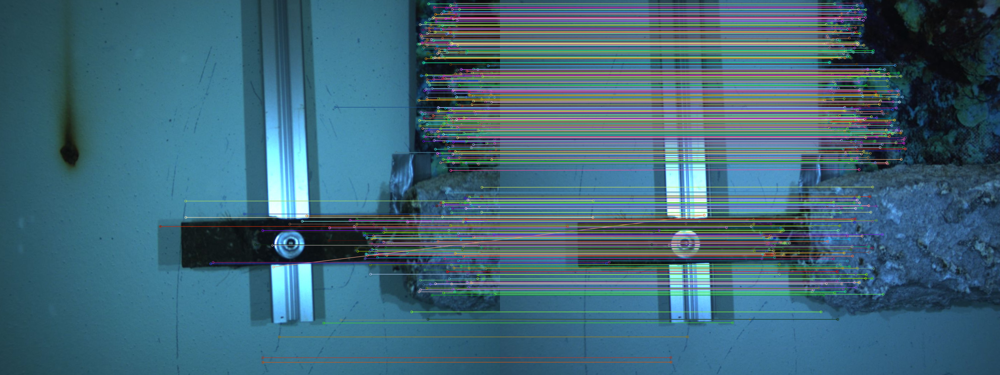

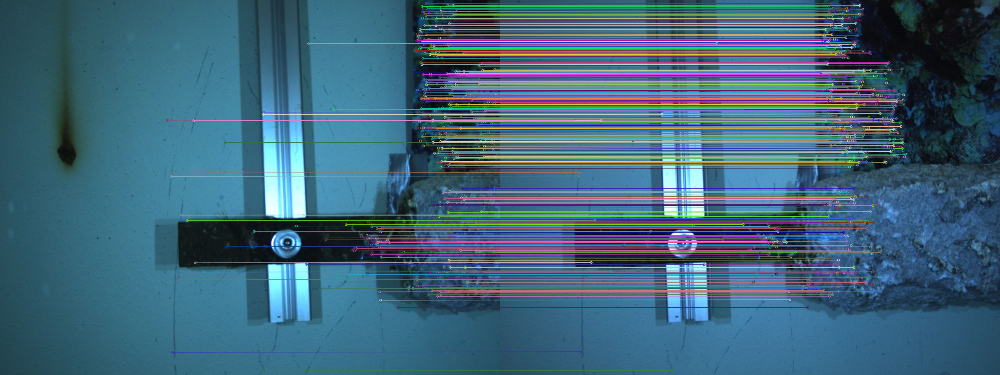

In [143]:
# define the sift parameters
sift_params_global = {"nfeatures": 10000,
                      "contrastThreshold": 0.01,
                      "edgeThreshold": 20}

# define which indices to find features and compute disparity map
indices = [10, 11]

# extract keypoints and matches for each index in indices
kptsL_list, kptsR_list, matches_list = feature_based_matching(left_enhanced_global,
                                                              right_enhanced_global,
                                                              indices,
                                                              stereoCalib_dict_global,
                                                              sift_params_global)

kptsL_xy_list, kptsR_xy_list, disp_list, depth_list, img_list = [], [], [], [], []

for ii in range(len(indices)):
  # current index
  i = indices[ii]

  # get current keypoints and matches
  kptsL = kptsL_list[ii]
  kptsR = kptsR_list[ii]
  matches = matches_list[ii]

  # get current left and right images
  imgL = left_rectified_global[i]
  img_list.append(imgL) # for plotting the disparity map in deliverables
  imgR = right_rectified_global[i]

  # extract coordinates and disparity
  kptsL_xy, kptsR_xy, disp = feature_based_disparity_map(kptsL, kptsR, matches)
  kptsL_xy_list.append(kptsL_xy)
  kptsR_xy_list.append(kptsR_xy)
  disp_list.append(disp)

  # compute depth
  depth = convert_disparity2depth(disp, stereoCalib_dict_global)
  depth_list.append(depth)

  # plot the matches
  matched_image = cv2.drawMatchesKnn(imgL, kptsL, imgR, kptsR, matches, None, flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
  cv2_imshow(matched_image)



## Dense Stereo Matching

ToDo:

* improve dense stereo matching by checking the uniqueness of each pixel, comparing the best cost C1 to the second best cost C2, where C1 < 0.8*C2 is a possible condition for uniqueness.
* define a minimum standard for the highest cost tolerable, where C <= maxC for valid matches.

this approach is not showing reliable disparity computations. The matching between left and right images is not as robust as in feature based.

In [144]:
"""
efficient dense stereo matching

use 1 to reduce complexity from O(H*W*k^2*d) to O(W*H*d)

methods supported: ssd, sad
"""
def compute_dense_disparity_eff(imgL, imgR, kernel_size, minDisp, maxDisp, stepDisp=1, method="ssd", unique_factor = 0.99, max_cost = 15):
  # convert to grayscale
  if len(imgL.shape) == 3:
    imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY)
  if len(imgR.shape) == 3:
    imgR = cv2.cvtColor(imgR, cv2.COLOR_BGR2GRAY)

  # image dimensions
  H, W = imgL.shape

  # kernel_size
  if kernel_size%2 == 0:
    kernel_size = kernel_size+1

  # minDisp
  if minDisp < 1:
    minDisp = 1

  # create array of disparities
  d_array = np.arange(minDisp, maxDisp, stepDisp)
  D = d_array.shape[0]

  # prepare cost matrix
  cost_volume = np.zeros((D, H, W))
  for i in range(D):
    d = d_array[i]
    # contruct right-shifted version of imgR by d units
    imgR_shifted = np.zeros_like(imgR)
    imgR_shifted[:, d:W] = imgR[:, :W-d]
    # compute difference
    diff = imgL.astype(float)-imgR_shifted.astype(float)
    # compute cost matrix depending on method
    if method == "ssd":
      cost = diff**2
    elif method == "sad":
      cost = np.abs(diff)
    # use the box filter to compute the sum of the costs inside a k-by-k window
    cost_sum = cv2.boxFilter(cost, ddepth=cv2.CV_32F, ksize=(kernel_size, kernel_size), normalize=False)
    cost_volume[i] = cost_sum

  # sort cost_volume along disparity dimension
  #cost_volume_sorted = np.sort(cost_volume, axis=0)
  # check validity of each pixel position
  #valid_disparity = cost_volume_sorted[0, :, :] < unique_factor*cost_volume_sorted[1, :, :]
  # check if cost does not exceed max_cost
  #valid_disparity = valid_disparity & (cost_volume_sorted[0, :, :] < max_cost*kernel_size**2)

  # get the argmin along the disparity values
  i_best = np.argmin(cost_volume, axis = 0)
  # get corresponding disparity values
  disp_best = d_array[i_best].astype(float)

  # assign invalid pixel disparities to nan
  #disp_best[~valid_disparity] = np.nan

  return disp_best

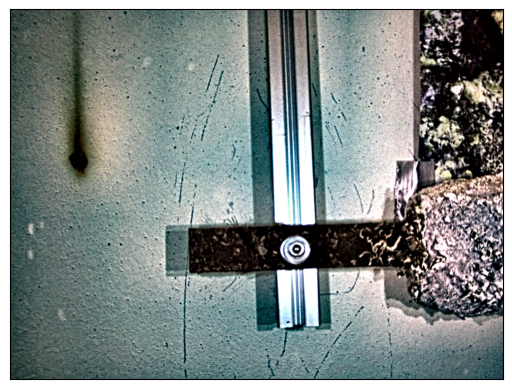

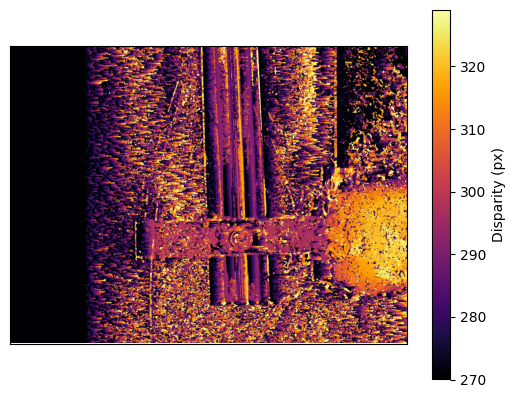

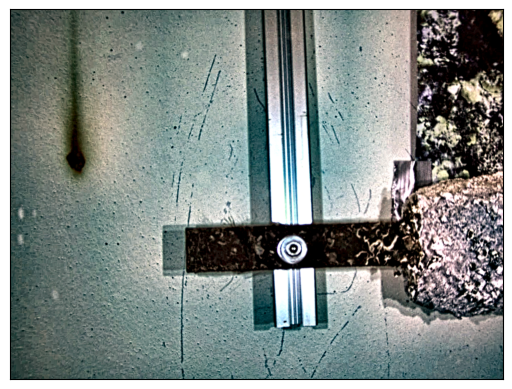

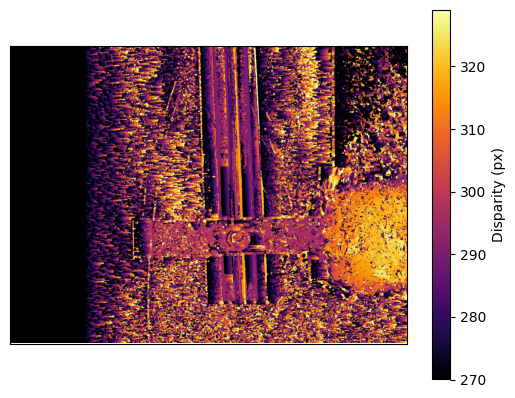

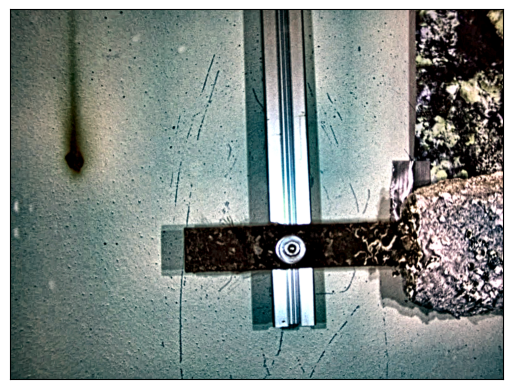

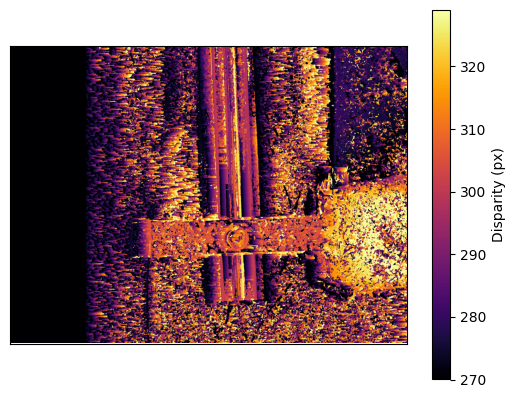

In [145]:
# define which indices to find features and compute disparity map
indices = [10, 11, 12]

disp_dense_list = []
for ii in range(len(indices)):
  i = indices[ii]
  imgL = left_enhanced_global[i]
  imgR = right_enhanced_global[i]
  disp_dense = compute_dense_disparity_eff(imgL, imgR, 5, 270, 330, 1, "sad")
  plt.imshow(cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB))
  plt.xticks([]); plt.yticks([])
  plt.show()
  im = plt.imshow(disp_dense, cmap="inferno")
  plt.xticks([]); plt.yticks([])
  cbar = plt.colorbar(im)
  cbar.set_label("Disparity (px)")
  plt.show()



## Deliverable

**Deliverable**:


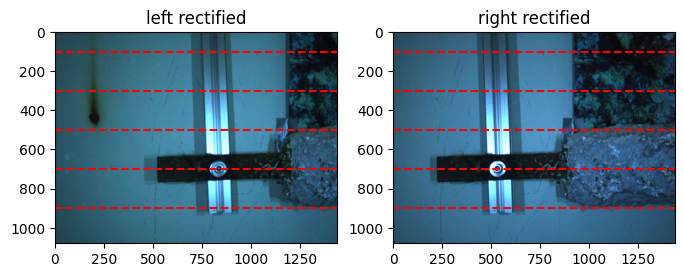

(1080, 1440, 3)
(1080, 1440, 3)


In [146]:
# (Code) Show corresponding epipolar lines to verify rectification.
N = len(left_rectified_global)
index = 10
index = index%N
left_image = left_rectified_global[index]
right_image = right_rectified_global[index]
plot_image_pair(left_image, "left rectified", right_image, "right rectified", True)
print(left_image.shape)
print(right_image.shape)

vmin = 260.03411865234375, vmax = 325.390625


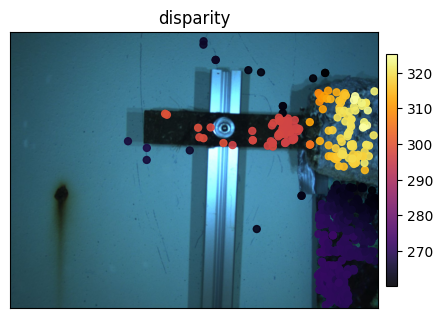

vmin = 260.0008544921875, vmax = 325.421875


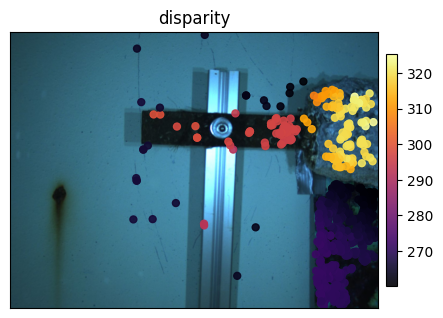

In [147]:
# (Code) Displaying the disparity map
for img, kptsL_xy, disp in zip(img_list, kptsL_xy_list, disp_list):
  plot_feature_based_disparity(img, kptsL_xy, disp, 5, "disparity")
  plt.show()

vmin = 0.38346375383638304, vmax = 0.4798428420559965


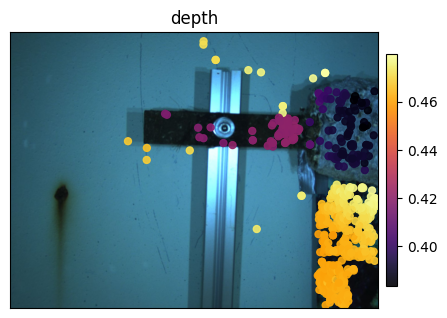

vmin = 0.38342693012160545, vmax = 0.4799042325048054


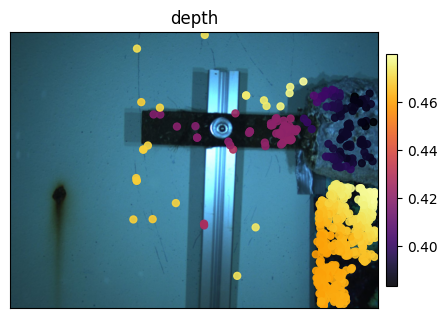

In [148]:
# (Code) Displaying the depth map
for img, kptsL_xy, depth in zip(img_list, kptsL_xy_list, depth_list):
  plot_feature_based_disparity(img, kptsL_xy, depth, 5, "depth")
  plt.show()

 - Discussion on the trade-offs between feature-based or dense stereo matching approaches. Justify your selection.

 <font color='red'>

SSD/SAD Dense Stereo Matching:

* tries to find a disparity for all


</font>

# Exercise 3 - Point Cloud Generation and Preprocessing
Transform depth maps into 3D point clouds. Using the standard projection formula, each pixel in the depth map can be reprojected into 3D space, yielding a set of points that represent the visible surface of the anode. To make the model visually meaningful, assign color information from the corresponding pixels in the left image to each 3D point. This process produces a textured point cloud, allowing you to visually identify surface details and material characteristics directly in 3D.

Before further processing, it's essential to clean and refine the point clouds. Raw reconstructions often contain noise, especially in regions affected by low contrast, refraction, or poor stereo matching. Begin by removing outliers to eliminate isolated or spurious points that don't belong to the actual surface. If the resulting dataset is too large or unevenly sampled, you may downsample the point cloud to a uniform density, improving computational efficiency for subsequent registration steps. Optionally, you can also apply smoothing filters to reduce small-scale noise and improve surface continuity.


In [149]:
# do implementation here

## depth -> points3D

In [150]:
def convert_depth2points3D(kpts_xy, depth, calib_dict, depth_threshold = 1):
  P1 = calib_dict["P1"]
  fx = P1[0, 0]
  fy = P1[1, 1]
  cx = P1[0, 2]
  cy = P1[1, 2]

  points3D = []
  kpts_xy_filt = []

  dmax = np.percentile(np.asarray(depth), 99)
  if dmax is None:
    dmax = np.max(np.asarray(depth))
  dmin = np.percentile(np.asarray(depth), 1)
  if dmin is None:
    dmin = np.min(np.asarray(depth))
  dthresh = dmin + depth_threshold*(dmax-dmin)

  print(f"dmin = {dmin}, dmax = {dmax}, dthresh = {dthresh}")
  plt.hist(depth)
  plt.show()

  for kpt_xy, d in zip(kpts_xy, depth):
    u, v = kpt_xy
    z = d
    x = z*(u-cx)/fx
    y = z*(v-cy)/fy

    if z < dthresh:
      points3D.append((x, y, z))
      kpts_xy_filt.append((u, v))

  return points3D, kpts_xy_filt

def pcd_from_points3D(points3D, colors=None):
  # convert to numpy
  points3D = np.asarray(points3D)
  # create pcd
  pcd = o3d.geometry.PointCloud()
  # save points as Vector3dVector
  pcd.points = o3d.utility.Vector3dVector(points3D)
  # save colors
  colors = np.asarray(colors)
  pcd.colors = o3d.utility.Vector3dVector(colors)
  # return pcd
  return pcd

def colors_from_img(img, kpts):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  kpts = np.array(kpts, dtype = int)
  colors = img[kpts[:, 1], kpts[:, 0]]
  return colors

"""
filter out points that have less than [count] neighbours within a radius of [radius]
"""
def filter_outliers(pcd, radius, count):
  # build kdtree
  pcd_tree = o3d.geometry.KDTreeFlann(pcd)

  valid_indices = []
  for i in range(len(pcd.points)):
    # find neighbors
    [k, idx, _] = pcd_tree.search_radius_vector_3d(pcd.points[i], radius)
    if k > count:
      valid_indices.append(i)

  pcd_filtered = pcd.select_by_index(valid_indices)
  print(f"kept {len(pcd_filtered.points)} out of {len(pcd.points)} points")

  return pcd_filtered



10000 left keypoints, 10000 right keypoints
dmin = 0.431229960611603, dmax = 0.537942353337383, dthresh = 0.537942353337383


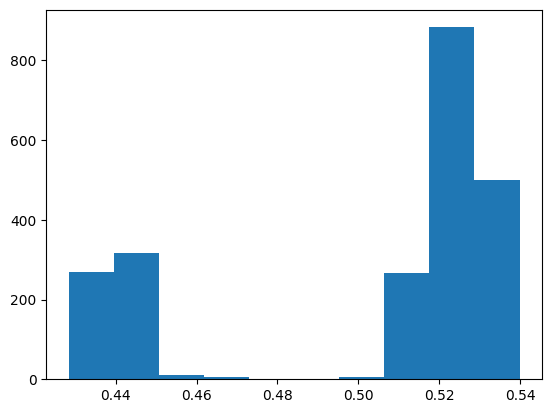

kept 2214 out of 2234 points


In [151]:
# define which indices to find features and compute disparity map
# only 1 index
index = 50


indices = [index]

# extract keypoints and matches for each index in indices
kptsL_list, kptsR_list, matches_list = feature_based_matching(left_rectified_global,
                                                              right_rectified_global,
                                                              indices,
                                                              stereoCalib_dict_global,
                                                              sift_params_global)


pcd = None
pcd_filt = None
for ii in range(len(indices)):
  # current index
  i = indices[ii]

  # get current keypoints and matches
  kptsL = kptsL_list[ii]
  kptsR = kptsR_list[ii]
  matches = matches_list[ii]

  # get current left and right images
  imgL = left_rectified_global[i]
  imgR = right_rectified_global[i]

  # extract coordinates and disparity
  kptsL_xy, kptsR_xy, disp = feature_based_disparity_map(kptsL, kptsR, matches)

  # compute depth
  depth = convert_disparity2depth(disp, stereoCalib_dict_global)

  #### new section ####
  # compute points3D
  points3D, kptsL_xy_filt = convert_depth2points3D(kptsL_xy, depth, stereoCalib_dict_global)

  # get colors
  colors = colors_from_img(imgL, kptsL_xy_filt)

  # create PointCloud
  pcd = pcd_from_points3D(points3D, colors)

  # filter outliers
  pcd_filt = filter_outliers(pcd, radius = 0.02, count = 5)

  #draw_geometries([pcd])




In [152]:
draw_geometries([pcd])

In [153]:
draw_geometries([pcd_filt])

**Deliverable:**


In [154]:
#  Visualization of one pre-filtered point cloud with texture (Open3D)

In [155]:
#  Visualization of one post-filtered point clouds with texture (Open3D)

 - Discussion about the technical decisions as well as, the outcome related to noise, density and visual appearance.

 <font color='red'> Justify Here (3 lines) ... </font>

# Exercise 4 — 3D Registration of Two Consecutive Point Clouds

Begin the reconstruction process by focusing on the alignment of **two consecutive point clouds**. Each cloud represents a partial view of the anode captured from slightly different camera positions as the stereo rig moves laterally. To create a 3D model, these views must be accurately registered in a common coordinate system. Start with an initial alignment. This rough alignment serves as the starting point for a more precise adjustment. Next, refine the registration using an Iterative Closest Point (ICP) -based algorithm. ICP iteratively minimizes the distance between overlapping regions of the two point clouds, improving their relative alignment until convergence. The result should be a well-registered pair of clouds that fit together smoothly, forming a coherent section of the anode's surface.

## Algorithm Description

From frame k we have:
* kptsL(k): keypoints that found a good match between Left and Right images
* disp(k): disparities of the keypoints
* points3D(k): corresponding 3D-points of kptsL(k)
* points3D_filt(k): filtered points after isolated points removal
* kptsL_filt(k): filtered keypoints associated with points3D_filt(k)
* disp_filt(k): disparities associated with kptsL_filt(k)

Comparing kptsL_filt(k) with kptsL_filt(k-1):
* some keypoints are in frame k-1 and not in frame k
* most keypoints are in frame k-1 and frame k
* some keypoints are in frame k and not in frame k-1

In ICP, we want to align point clouds that have total correspondence.

Main Algorithm:
1) compute kptsL(k), disp(k), points3D(k)
2) obtain kptsL_filt(k), disp_filt(k), points3D_filt(k)
3) compute kptsLL(k)



In [156]:
# do implementation here

**Deliverable:**

In [157]:
# Visualization of the aligned model (Open3D)

In [158]:
# Report ICP convergence metrics (residuals, iterations).

 - Describe the reasons for selecting a specific 3D Registration technique for this problem (error, density and visual appearance).

 <font color='red'> Justify Here (4 lines) ... </font>

# Exercise 5 — Multi-view 3D Registration

Extend your registration process to the entire dataset. Instead of aligning only two consecutive point clouds, sequentially register all valid point clouds acquired along the scanning path. Each new alignment should build upon the previous ones, gradually assembling a complete representation of the anode.
Once all point clouds have been successfully registered into a single coordinate frame, merge them to create the full 3D model. Incorporate the color information from the left images to produce a textured reconstruction, capturing both the geometry and visual appearance of the anode.

The outcome of this step should be a cohesive, high-quality 3D model that accurately reflects the anode's surface structure and material characteristics across its entire length.

In [159]:
# do implementation here

**Deliverable:**

In [160]:
# Visualization of the model of the anode (Open3D)

In [161]:
# Save of the anode model to a file (Open3D).
# ATTENTION::: Download the file to your computer since it will be needed during the submission of the assignment.

# Exercise 6 — Physical Measurements of the Anode

With the complete 3D reconstruction of the anode now available, the next step is to extract key physical measurements from the model. These quantitative assessments will help evaluate both the geometry of the anode and the accuracy of your reconstruction.

Compute the following parameters:

- Maximum width along the X-axis — representing the total horizontal span of the anode.

- Maximum height along the Y-axis — corresponding to its vertical extent.

- Total volume.

- Width of the supporting metal brackets located at each end of the anode.

Finally, visualize these measurements directly on the 3D model using annotated plots or overlays.

In [162]:
# do implementation here

**Deliverable:**

A short table with all measured quantities.

<font color='red'> Add table here ... </font>

Justify of how measurements were obtained (the implementation that was performed to automatically extract the values).

 <font color='red'> Justify Here (4 lines) ... </font>

--------------------------------------------------------------------------

# Ethics

<font color='red'>
Disclaimer for the use of AI tools: complete the text that is placed in between brackets. Convert this disclaimer to PDF, sign it and deliver the PDF in Moodle.
</font>


<font color='red'> [Student Name #1] </font> and <font color='red'> [Student Name #2] </font> declare that the work presented in this assignment titled "[Assignment Title]" was completed independently, except where explicitly noted. I confirm the following with regard to the use of AI tools:

**Extent of AI Tool Contribution:**

I have used the following AI tool(s) for assistance in this assignment:

1. Tool(s) Used: [List AI tools used, e.g., ChatGPT, Grammarly, QuillBot, etc.]
Nature of Assistance: [Specify the task(s) for which the AI tool was used, e.g., brainstorming ideas, refining language, generating summaries, grammar correction, etc.]
2. Percentage of AI Contribution: [Estimate the percentage of the assignment influenced by the AI tool.]
3. Human Oversight and Contribution:
Despite the use of AI tools, I confirm that the critical thinking, analysis, problem-solving, and final decision-making processes in this assignment were carried out by me. The AI tools were used solely as support for the following purposes: [Elaborate on how the AI tool helped, e.g., improving readability, offering suggestions for structure, or enhancing clarity.]


**Originality and Integrity:**
I take full responsibility for ensuring that the content of this assignment is original and properly cited where applicable. The use of AI tools did not result in any unintentional plagiarism or misrepresentation of ideas from external sources.

**Compliance with Academic Integrity Guidelines:**
I understand the importance of academic integrity, and I confirm that the usage of AI tools complies with the guidelines provided by [School/University Name]. All AI-generated outputs were critically evaluated and appropriately incorporated into the final submission.

Signed,
[Student Name]
[Date]